# 1. Introducción
El objetivo de este notebook es realizar la ingesta del conjunto de datos california_housing, tras ello se continuará con un análisis exploratorio de datos para extraer conclusiones e información, y finalizará con el entrenamiento y evaluación de un modelo de predicción basado en estos datos.

Este conjunto de datos estudia diversos parámetros sobre las viviendas de California y se obtuvo a partir del censo de EE.UU. de 1990, utilizando una fila por grupo de bloques, esta es la unidad geográfica más pequeña para la que la Oficina del Censo de Estados Unidos publica datos por muestreo.

Para realizar todos estos pasos se utilizará un módulo propio que incluye todas las funciones necesarias para llevar a cabo un estudio de los datos.

In [ ]:
# Se importa el módulo con todas las funciones auxiliares
from EDAModule import ExploratoryDataAnalysis

# 2. Ingesta
El primer paso de este trabajo será realizar la ingesta del dataset california_housing, para ello se descargará a través del método fetch_california_housing y mediante la librería Pandas se cargará toda su información en una estructura de tipo dataframe.

Para comenzar a trabajar con el módulo importado lo primero que se debe hacer es inicializarlo con el dataframe que se ha creado, a continuación se almacenará su diccionario de información y finalmente se consultará para observar su contenido.

Este diccionario de información almacena algunas características del dataset como dimensiones, contexto de sus variables e información sobre el origen del mismo.


In [ ]:
from sklearn.datasets import fetch_california_housing
import pandas as pd

# Se descarga el conjunto de datos
california_housing = fetch_california_housing()

# Se construye un dataframe a partir del dataset descargado
data = pd.DataFrame(california_housing.data, columns=california_housing.feature_names)
data['target'] = california_housing.target

# Se inicializa el módulo mediante el dataframe
eda = ExploratoryDataAnalysis(dataset=data)

# Se establece el valor de la propiedad descripción del dataset en el módulo y se muestra
eda.setDescription(california_housing.DESCR)
print("Dataset description: ", eda.getDescription())

Dataset description:  .. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

Th

# 3. Análisis Exploratorio de Datos

El análisis exploratorio de datos tiene como objetivo obtener un mayor conocimiento sobre el dataset con el que se va a trabajar, con este propósito se estudiarán los siguientes puntos:

* Dimensiones
* Variables
* Tipos
* Estadísticas
* Valores nulos
* Outliers
* Valores únicos
* Histogramas
* Matriz de correlación
* Gráficos de dispersión

**Dimensiones:**

En primer lugar se observarán las dimensiones y el tamaño del conjunto de datos. En este caso se trata de un dataset con 9 variables y 20640 casos de estudio, lo cual da como resultado un total de 185760 datos.
Además se expondrá una muestra de las 5 primeras filas del conjunto de datos.

In [ ]:
# Se ejecuta la función getShape para obtener las dimensiones del dataframe
print("1. Shape: ", eda.getShape())

# Se ejecuta la función getSize para obtener el tamaño del dataframe
print("\n2. Size:", eda.getSize())

# Se ejecuta la función getHead para obtener una muestra del dataframe
print("\n3. Head:")
eda.getHead()

1. Shape:  (20640, 9)

2. Size: 185760

3. Head:


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


**Variables:**

El siguiente paso será explicar el significado de cada una de las variables que integran el dataset:

* MedInc: renta media del grupo de bloques.

* HouseAge: edad media de la vivienda en el grupo de bloques.

* AveRooms: número medio de habitaciones por hogar.

* AveBedrms: número medio de dormitorio por hogar.

* Population: número de habitantes del grupo de bloques.

* AvOccup: número medio de miembros del hogar.

* Latitude: latitud del grupo de bloques.

* Longitude: longitud del grupo de bloques.

* Target: valor medio de la vivienda expresado en cientos de miles de dólares.

In [ ]:
# Se ejecuta la función getColumns para obtener el listado de columnas del dataframe
print("4. Columns:", eda.getColumns())

4. Columns: Index(['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup',
       'Latitude', 'Longitude', 'target'],
      dtype='object')


**Tipos:**

Una vez exlicadas las distintas variables se señalarña el tipo de datos que contienen. En este caso únicamente se encuentran columnas numéricas, concretamente de tipo float64.

In [ ]:
# Se ejecuta la función getTypes para obtener el tipo de cada variable del dataframe
print("5. Data Types:")
eda.getTypes()

5. Data Types:


MedInc        float64
HouseAge      float64
AveRooms      float64
AveBedrms     float64
Population    float64
AveOccup      float64
Latitude      float64
Longitude     float64
target        float64
dtype: object

**Estadísticas:**

En este punto se evindenciarán una serie de estadísticas generales para cada una de las variables, en concreto las siguientes características:

* count: número de valores no nulos
* mean: media de los valores
* std: desviación estándar
* min: valor mínimo
* 25%: percentil 25
* 50%: percentil 50
* 75%: percentil 75
* max: valor máximo

En base a las estadísticas mostradas se pueden apreciar una serie de parámetros que destacan:

* std: el valor medio de AveOccup es 3.07 mientras que su desviación estándar es 10, lo cual muestra una amplia variación en el número de personas que habitan las viviendas.
* min: el valor medio de Population es 1425.47, mientras que su valor mínimo es 3, lo cual muestra índicios de la existencia de bloques casi abandonados. Además se puede apreciar un valor medio para HouseAge de 28.63 y un valor mínimo de 1, lo cual evidencia que se siguen construyendo nuevos bloques de viviendas.
* max: el valor medio de MedInc es 3.87 mientras que su valor máximo es 15, esto refleja la presencia de sueldos extremadamente más altos en la zona. AveRooms, AveBedrms, Population y AveOccup presentan valores máximos varios órdenes de magnitud superiores a sus valores medios, este asunto se estudiará en el siguiente punto sobre Outliers.

In [ ]:
# Se ejecuta la función getStatistics para obtener datos estadísticas de todas las columnas del dataframe
print("6. Summary Statistics for Numerical Columns:")
eda.getStatistics()

6. Summary Statistics for Numerical Columns:


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


**Nulos:**

A continuación se indicará el número de valores nulos que presenta cada variable.

Como se puede contemplar este dataset no presenta valores nulos en ninguna de sus columnas.


In [ ]:
# Se ejecuta la función getNulls para obtener el número de valores nulos de cada columna del dataframe
print("7. Checking for Missing Values:")
eda.getNulls()

7. Checking for Missing Values:


MedInc        0
HouseAge      0
AveRooms      0
AveBedrms     0
Population    0
AveOccup      0
Latitude      0
Longitude     0
target        0
dtype: int64

**Outliers**

Los outliers son valores extremos de una variable numérica del dataset, normalmente se encuentran alejados del percentil 25 y del percentil 75, por tanto al visualizar las columnas medianta gráficas boxplot se podrán localizar en los extremos de la imagen.

Para advertir la presencia de outliers se generará una gráfica boxplot de cada variable. A la vista de todas las gráficas, se puede evidenciar la posible presencia de outliers en diversas columnas:

* AveRooms: la presencia de valores extremos como 140 habitaciones puede ser debida a que grandes fincas se anuncien como viviendas.
* AveBedrms: la presencia de valores extremos como 35 dormitorios puede ser debida a que hoteles se anuncien como viviendas.
* Population: la presencia de valores extremos en esta categoría no debería ser preocupante, puesto que simplemente depende del número de personas que viva en dicha localidad.
* AveOccup: la presencia de valores extremos puede deberse a que se trate de viviendas más céntricas o situadas en ubicaciones clave turísticas.

8. Boxplot visualization


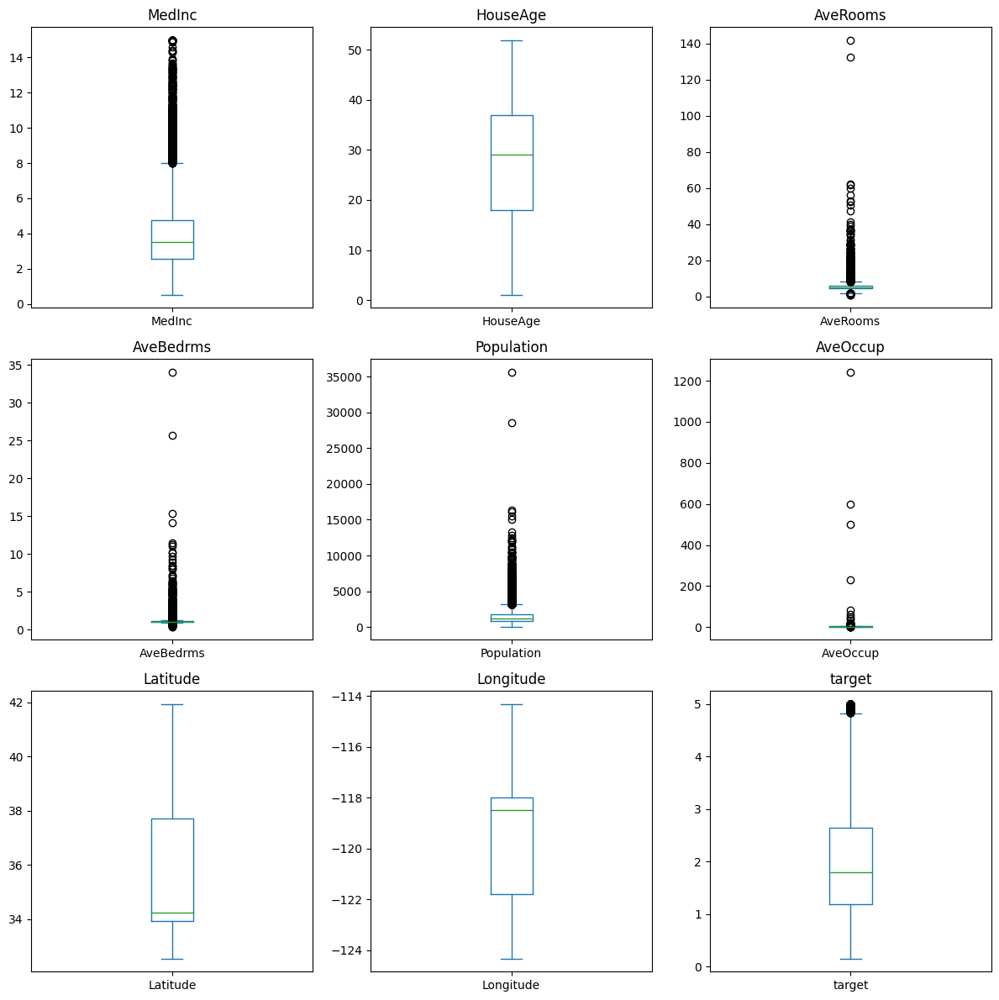

In [ ]:
# Se ejecuta la función getBoxplots para mostrar un gráfico boxplot de cada variable del dataframe
print("8. Boxplot visualization")
eda.getBoxplots()

**Únicos**

Los valores únicos son todos los posibles valores distintos que aparecen en una variable. En el caso de las numéricas, debido a la cantidad de posibles valores que suelen tener, excepto si son variables binarias, no resulta tan interesante como en el de las categóricas, que permiten observar las distintas categorías de la columna, por lo que para este dataset no se extraerá mucha información de este punto.
En este apartado se hallará en primer lugar el número de valores distintos que presenta cada columna y en segundo lugar el número de apariciones de cada valor.

Este punto permite dividir las variables en 3 grupos en base a la cantidad de valores únicos que presentan:
* Alta variedad (>10k): MedInc, AveRooms, AveBedrms y AveOccup
* Media variedad (1k<x<10k): Population y target
* Baja variedad (<1k): HouseAge, Latitude y Longitude

In [ ]:
# Se ejecuta la función getUniques para mostrar los valores únicos de cada variable del dataframe
print("9. List of Unique Values:")
print(eda.getUniques())

# Se ejecuta la función countUniques para mostrar el número de valores únicos de cada variable del dataframe
print("\n10. Count of Unique Values:", eda.countUniques())

9. List of Unique Values:
MedInc        12928
HouseAge         52
AveRooms      19392
AveBedrms     14233
Population     3888
AveOccup      18841
Latitude        862
Longitude       844
target         3842
dtype: int64

10. Count of Unique Values: 
Columna: MedInc
3.1250     49
15.0001    49
2.8750     46
2.6250     44
4.1250     44
           ..
4.0774      1
4.1767      1
6.1814      1
6.4319      1
2.0943      1
Name: MedInc, Length: 12928, dtype: int64

Columna: HouseAge
52.0    1273
36.0     862
35.0     824
16.0     771
17.0     698
34.0     689
26.0     619
33.0     615
18.0     570
25.0     566
32.0     565
37.0     537
15.0     512
19.0     502
27.0     488
24.0     478
30.0     476
28.0     471
20.0     465
29.0     461
31.0     458
23.0     448
21.0     446
14.0     412
22.0     399
38.0     394
39.0     369
42.0     368
44.0     356
43.0     353
40.0     304
13.0     302
41.0     296
45.0     294
10.0     264
11.0     254
46.0     245
5.0      244
12.0     238
8.0      206


**Histogramas:**

Los histogramas permiten observar el peso, es decir, el número de apariciones, que toma cada rango de valores dentro del conjunto, para ello representa a cada rango mediante una columna.

Inicialmente se generarán histogramas con 10 bins para todas las variables y a la vista de la distribución de los valores en las distintas gráficas se pueden extraer una serie de conclusiones:

* MedInc: la mayoría de valores se encuentran entre 2.5 y 5.0, por lo cual es el ingreso más probable que es posible esperar en la zona.
* HouseAge: los valores se distribuyen de un modo más uniforme que en el resto de casos debido a que independientemente del momento temporal se han seguido construyendo nuevas casas para que la gente pueda vivir en ellas.
* Latitude y Longitude: cabe resaltar que ambas gráficas presentan dos picos muy pronunciados y valores que van disminuyendo a medida que nos alejemos de ellos, probablemente ambas variables se refieran dos puntos concretos muy concurridos.
* Target: refleja una distribución de valores ligeramente uniforme pero centrada en los más bajos.

Debido al escaso número de bins no se aprecia correctamente la distribución de las columnas AveRooms, AveBedrms, Population y AveOccup, por lo que se volverán a generar los histogramas, pero esta vez con 100 bins para obtener un mayor detalle en estas variables cuya distribución se encuentra más concentrada. Con este número de bins se pueden realizar las siguientes reflexiones:

* AveRooms y AveBedrms: lo normal es que las viviendas tengan entre 2 o 3 dormitorios y menos de 10 habitaciones.
* Population: la mayoría tiene entre 0 y 500 habitantes de media.
* AveOccup: todos los casos se encuentran por debajo del 3.

11. Histogram visualization with 10 bins


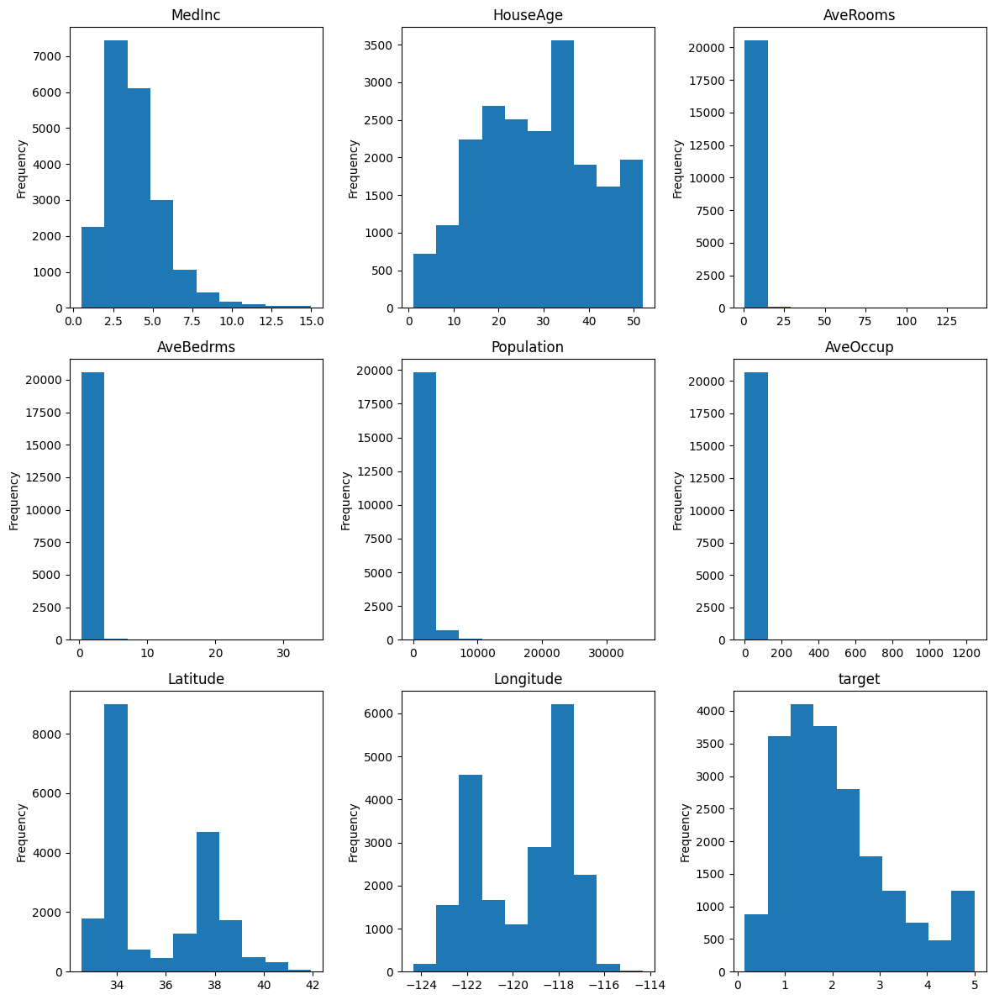


Histogram visualization with 100 bins


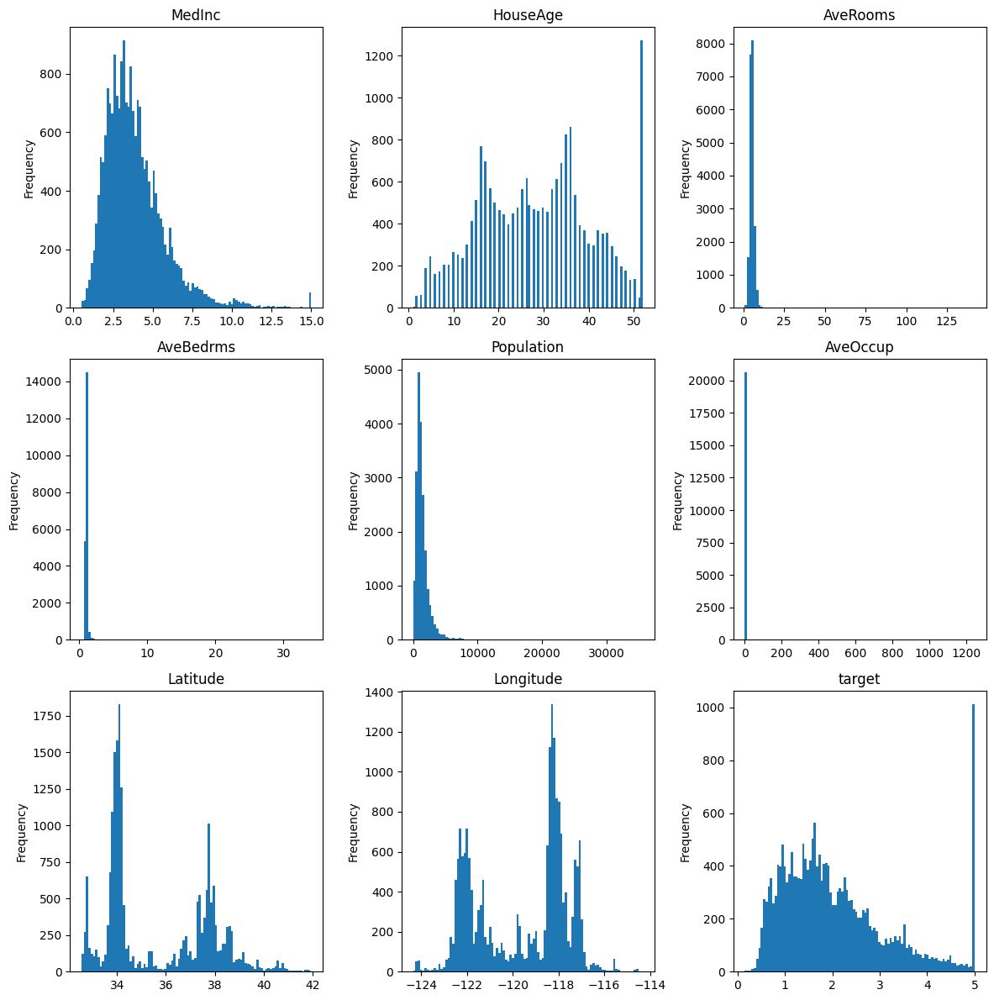

In [ ]:
# Se ejecuta la función getHistograms para mostrar un histograma de 10 bins para cada variable del dataframe
print("11. Histogram visualization with 10 bins")
eda.getHistograms()

# Se ejecuta la función getHistograms para mostrar un histograma de 100 bins para cada variable del dataframe
print("\nHistogram visualization with 100 bins")
eda.getHistograms(100)

**Matriz de correlación**

La matriz de correlación permite observar el grado de relación que se da entre las distintas variables, es decir, como de influyente resulta el valor de una para otra. Mediante la tabla generada, será posible ver qué variables pueden resultar más importantes a la hora de predecir otras.

Aunque en general la mayoría de variables no tienen mucha relación entre sí, se pueden encontrar algunos pares de variables con indicios de relación, a continuación se explorarán todos aquellos que han obtenido una puntuación superior a 0.3:

* Longitude y Latitude: los bloques suelen estar organizados por barrios y por tanto tiene sentido que normalmente compartan valores cercanos de longitud y latitud.
* AveRooms y AveBedrms: a mayor número de habitaciones es posible obtener un mayor número de dormitorios.
* MedInc y target: cuanto mayores sean las ganancias mayor será el precio de la vivienda que puede permitirse.
* Population y HouseAge: cuanto mayor es la población, las viviendas suelen tener mayor antigüedad, ya que normalmente se construyeron para albergar a los antepasados de la actual población.

12. Correlation Matrix:


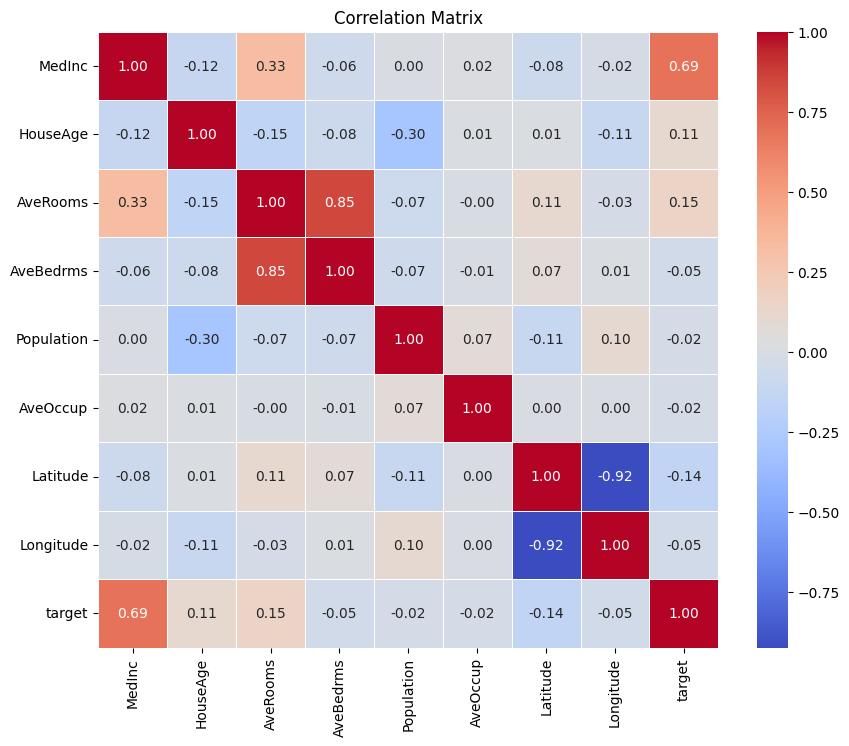

In [ ]:
# Se ejecuta la función getCorrelationMatrix para mostrar la matriz de correlación del dataframe
print("12. Correlation Matrix:")
eda.getCorrelationMatrix()

**Gráficos de dispersión:**

Los gráficos de dispersión nos permiten comparar la relación entre los valores de distintas variables. Concretamente se estudiará la relación entre los pares de variables con mayor grado de interrelación según la matriz de correlación

En cuanto a los pares de variables representados se puede afirmar:

* Latitude-Longitude: muestran una gran linealidad en sus puntos, encontrándose grandes aglomeraciones concretas correspondiente a la distribución en barrios de mayor densidad poblacional.
* AveRooms-AveBedrms: revela como la gran mayoría de viviendas tienen pocas habitaciones y dormitorios estando pensadas para ser habitadas por un núcleo menor, mientras que para mayores números encontramos solo apariciones puntuales.
* MedInc-target: revela que la gran mayoría de la población recibe sueldos menores y por tanto tienen como objetivo viviendas de menor precio, mientras que aquellos con mayor sueldo (más escasos) buscan viviendas de mayor precio. Finalmente encontramos una particularidad en este gráfico, las viviendas con el precio más extremadamente alto estan entre los objetivos de todo el rango de sueldos, esto puede deberse a gente que no reciba un sueldo tan alto pero gracias ayudas de familiares, herencias o fuentes fraudulentas de dinero pueden tener como objetivo este tipo de viviendas.
* HouseAge-Population: muestra una distribución medianamente uniforme entre las edad de las casas y la población, demostrando que independientemente de la edad del bloque hay un número similar de gente que reside en él. Igualmente se puede apreciar que los bloques más recientes tienen ligeros aumentos de poblacion en ellos mientras que los más antiguos tienen ligeras reducciones, este aspecto tiene sentido debido a que socialmente por estética o seguridad se prefieren comprar o alquilar viviendas de construcción más reciente frente a las más antiguas.

13. Scatter Plot visualization


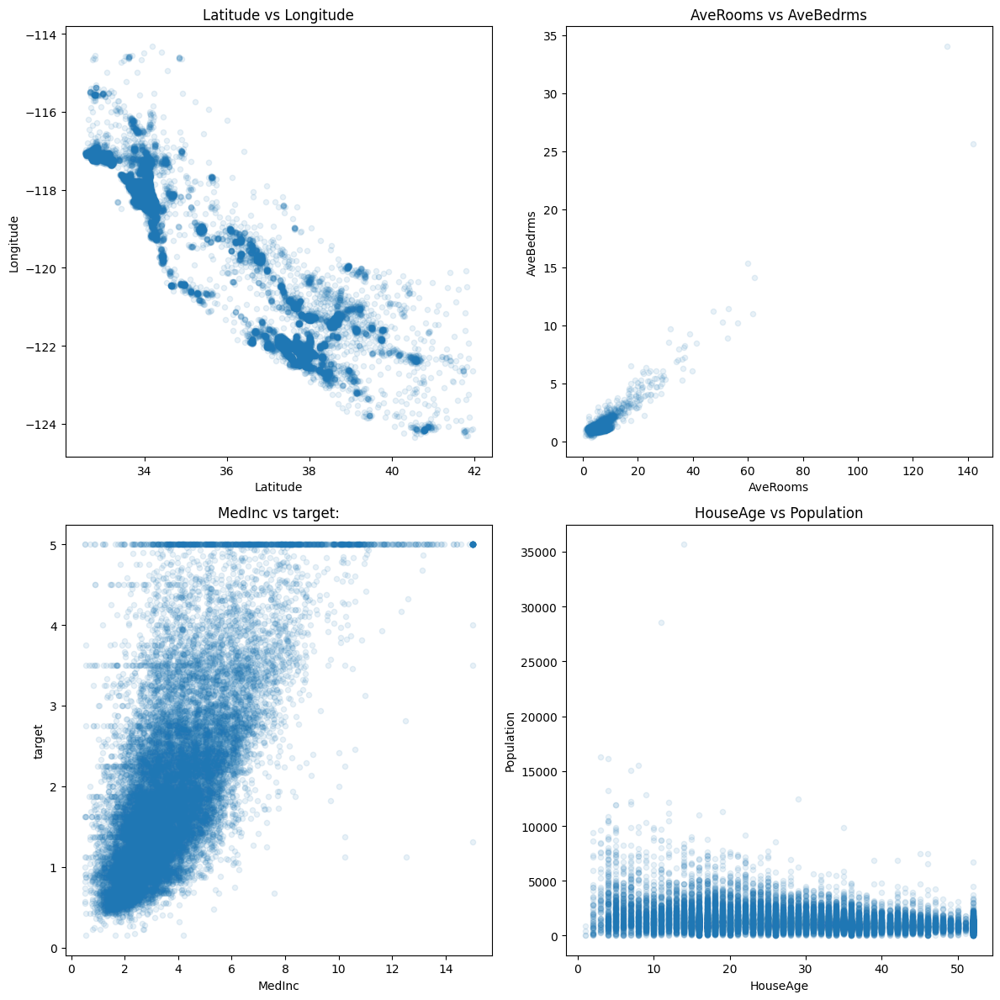

In [ ]:
# Se importa la librería matplotlib
import matplotlib.pyplot as plt

# Se genera una figura con espacio para 4 gráficos
print("13. Scatter Plot visualization")
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Se inicializa cada subfigura para mostrar un gráfico de dispersión entre dos variables
data.plot.scatter(x='Latitude', y='Longitude', ax=axs[0, 0], alpha=0.1)
axs[0, 0].set_title('Latitude vs Longitude')

data.plot.scatter(x='AveRooms', y='AveBedrms', ax=axs[0, 1], alpha=0.1)
axs[0, 1].set_title('AveRooms vs AveBedrms')

data.plot.scatter(x='MedInc', y='target', ax=axs[1, 0], alpha=0.1)
axs[1, 0].set_title('MedInc vs target:')

data.plot.scatter(x='HouseAge', y='Population', ax=axs[1, 1], alpha=0.1)
axs[1, 1].set_title('HouseAge vs Population')

# Se muestra la figura
plt.tight_layout()
plt.show()

Finalmente se generará un último gráfico de dispersión que nos permita estudiar de manera conjunta varios de los aspectos de mayor interés del punto anterior.

Para ello se partirá del gráfico que representa el par Latitude - Longitude, por ser el que tiene la forma sobre la que podemos extraer más información, se añadirá que el gradiente de color del punto se base en la variable target y finalmente que el tamaño del punto se corresponda con el valor de la columna Population.

Con la configuración establecida este gráfico permite observar la distribución del precio de las viviendas así como la densidad poblacional en base a la longitud y latitud de su ubicación.

Observando el gráfico es posible apreciar 3 grandes grupos en base a su densidad poblacional, uno centrado en longitud y latitud que presenta las viviendas más baratas y con mayor dispersidad de población, frente a otros dos grupos más alejados con viviendas de mayor valor y una mayor concentración poblacional.

Posiblemente este reparto se deba a la forma intrínseca del estado de California, puesto que si se compara el mapa geográfico con el gráfico generado se puede observar que las viviendas más caras y con mayor población se corresponderían con las más cercanas a la costa, mientras que las de menor valor y población se corresponderían con las del interior del estado, de menor interés turístico y económico.

Gracias a esta representación podemos entender de un mejor modo la distribución de viviendas en todo el territorio, así como su valor y población.



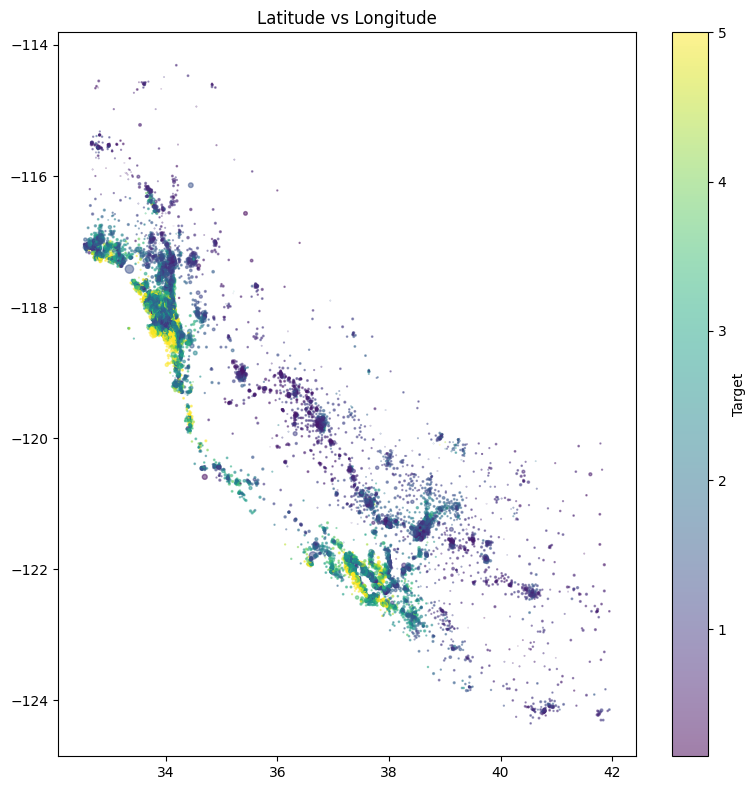

In [ ]:
# Se crea la figura y los ejes
fig, ax = plt.subplots(figsize=(8, 8))

# Se inicializa el gráfico de dispersión
scatter = ax.scatter(x='Latitude', y='Longitude', data=data, alpha=0.5, c='target', cmap='viridis', s=data['Population']*0.001)

# Se añade una barra de colores
cbar = plt.colorbar(scatter)
cbar.set_label('Target')

ax.set_title('Latitude vs Longitude')

# Se muestra la figura
plt.tight_layout()
plt.show()

# 4. Análisis Exploratorio de Datos Automático

El Análisis Exploratorio de Datos Automático permite realizar un estudio de manera automátizada de todas las variables de un conjunto de datos. En este punto se realizarán dos EDAs Automáticos, un primer estudio centrado en las estadísticas del conjunto de datos y un segundo enfocarado en su representación gráfica, que servirán a modo de resumen del trabajo realizado en puntos anteriores.

**EDA Automático Estadístico**

A continuación se ejecutará un eda automático centrado en extraer estadísticas, para ello se utiliza la librería sweetviz que permite obtener los siguientes datos de las columnas del dataset:

* ROWS: número de filas
* DUPLICATES: número de filas duplicadas
* FEATURES: número de columnas
* CATEGORICAL: número de columnas categóricas
* NUMERICAL: número de columnas numéricas
* VALUES MISSING: número de valores nulos
* DISTINCT: número de valores distintos
* MEDIAN: mediana
* AVG: media
* STD: desviación estándar
* VAR: varianza
* MIN: valor mínimo
* MAX: valor máximo
* 5%: percentil 5
* Q1: percentil 25
* Q3: percentil 75
* 95%: percentil 95
* RANGE: rango de valores
* IQR: rango intercuartílico
* SUM: sumatorio

Mediante pip se instalará la librería Sweetviz en el notebook y tras ello se ejecutará el análisis estadístico.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 16.1 MB/s eta 0:00:00


                                             |          | [  0%]   00:00 -> (? left)


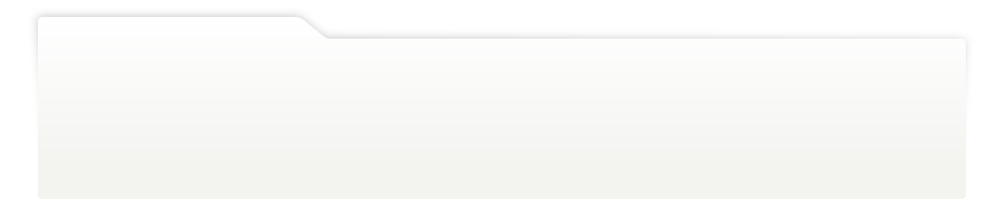
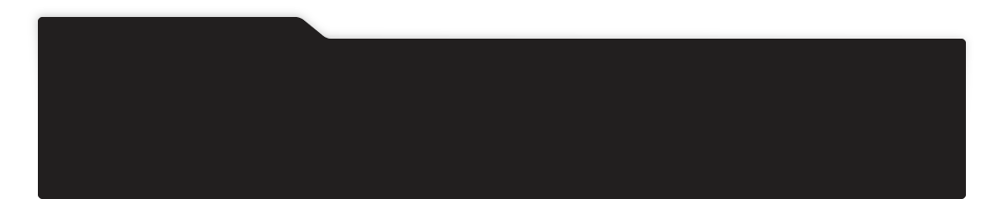
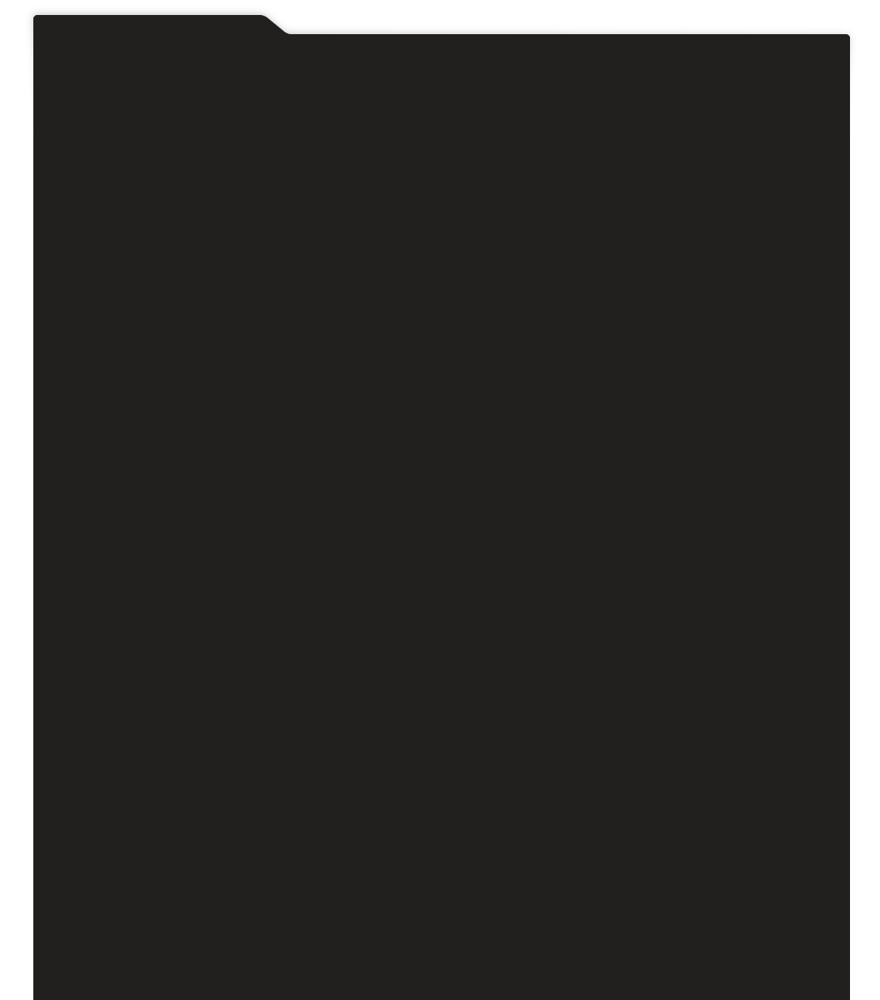
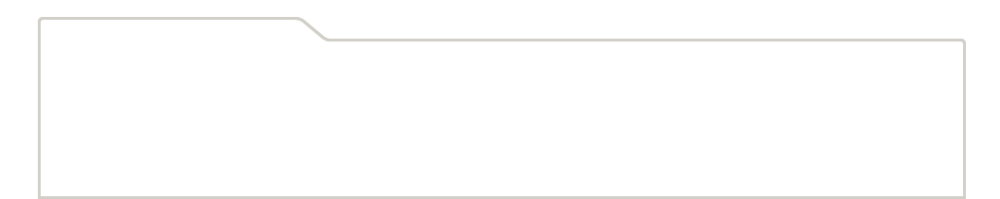
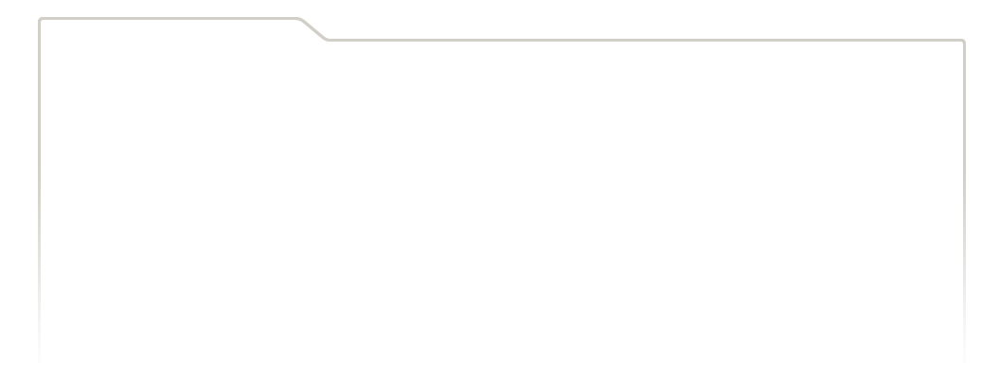
...
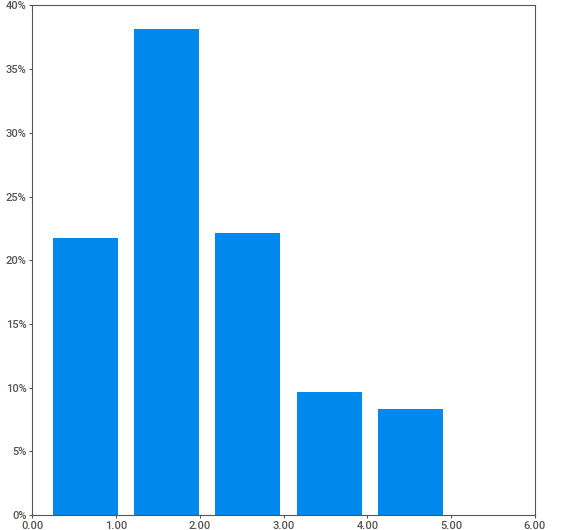
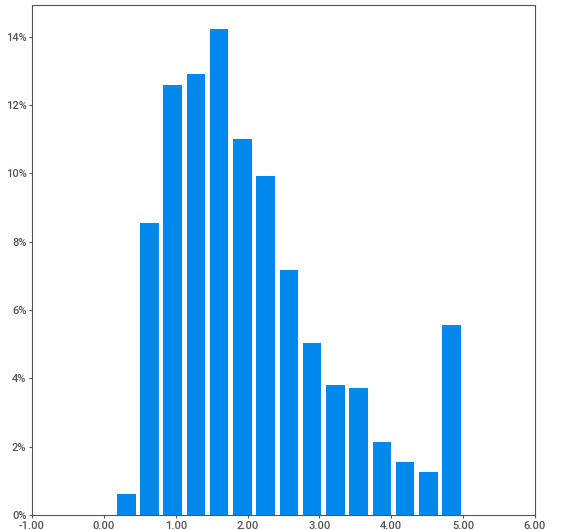
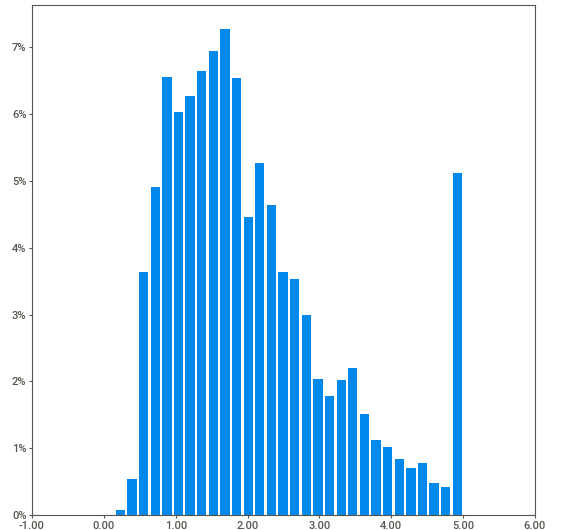
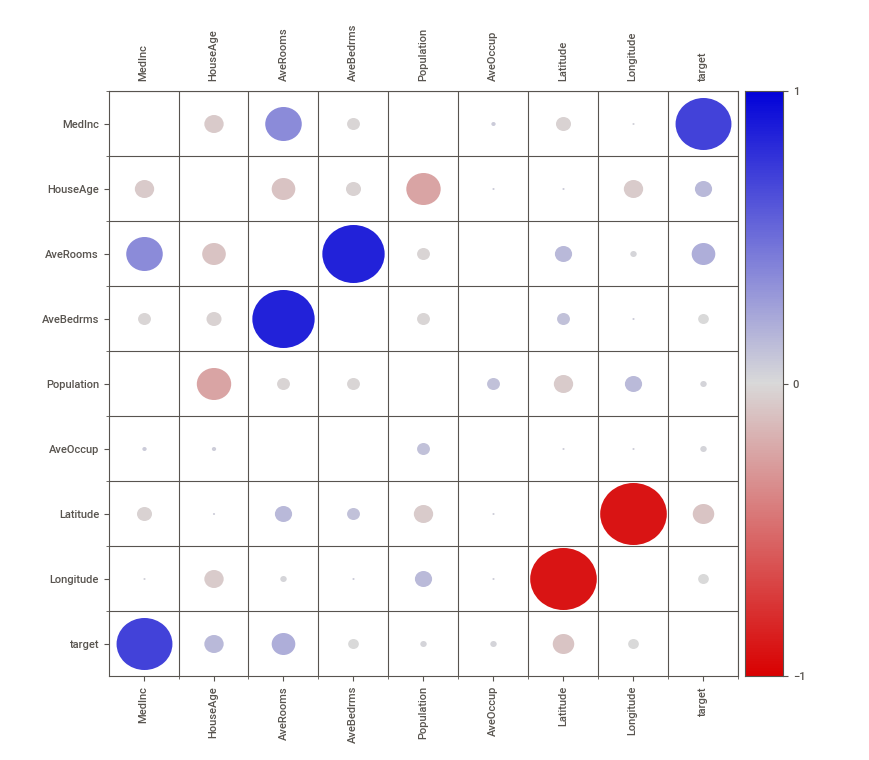
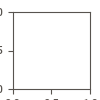

In [ ]:
# Se instala la librería Sweetviz
!pip install Sweetviz

# Se ejecuta getAutomaticStatisticalEDA para obtener un análisis estadístico automático
eda.getAutomaticStatisticalEDA()

**EDA Automático Gráfico**

En este punto se llevará a cobo un eda automático centrado en representar gráficas, para ello se empleará la librería autoviz que permite dibujar los siguientes gráficos de las columnas del dataset:

* Scatter Plot: gráfico de dispersión
* Histogram: histograma
* Box Plot: gráfico de caja
* Probability Plot: gráfico de probabilidad
* Correlation Matrix: matriz de correlación

Mediante %matplotlib inline se habilitará la representación de gráficos con matplotlib y tras ello se inicia el análisis gráfico.

Shape of your Data Set loaded: (20640, 9)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  9
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix these data quality issues in the dataset, import FixDQ from autoviz...
    All variable

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
MedInc,float64,0.000000,NA,0.499900,15.000100,Column has 681 outliers greater than upper bound (8.01) or lower than lower bound(-0.71). Cap them or remove them.
HouseAge,float64,0.000000,NA,1.000000,52.000000,No issue
AveRooms,float64,0.000000,NA,0.846154,141.909091,Column has 511 outliers greater than upper bound (8.47) or lower than lower bound(2.02). Cap them or remove them.
AveBedrms,float64,0.000000,NA,0.333333,34.066667,"Column has 1424 outliers greater than upper bound (1.24) or lower than lower bound(0.87). Cap them or remove them., Column has a high correlation with ['AveRooms']. Consider dropping one of them."
Population,float64,0.000000,NA,3.000000,35682.000000,Column has 1196 outliers greater than upper bound (3132.00) or lower than lower bound(-620.00). Cap them or remove them.
AveOccup,float64,0.000000,NA,0.692308,1243.333333,Column has 711 outliers greater than upper bound (4.56) or lower than lower bound(1.15). Cap them or remove them.
Latitude,float64,0.000000,NA,32.540000,41.950000,No issue
Longitude,float64,0.000000,NA,-124.350000,-114.310000,Column has a high correlation with ['Latitude']. Consider dropping one of them.
target,float64,0.000000,NA,0.149990,5.000010,Column has 1071 outliers greater than upper bound (4.82) or lower than lower bound(-0.98). Cap them or remove them.


Number of All Scatter Plots = 45


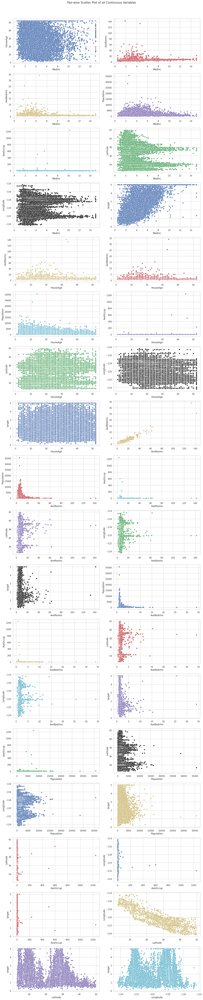

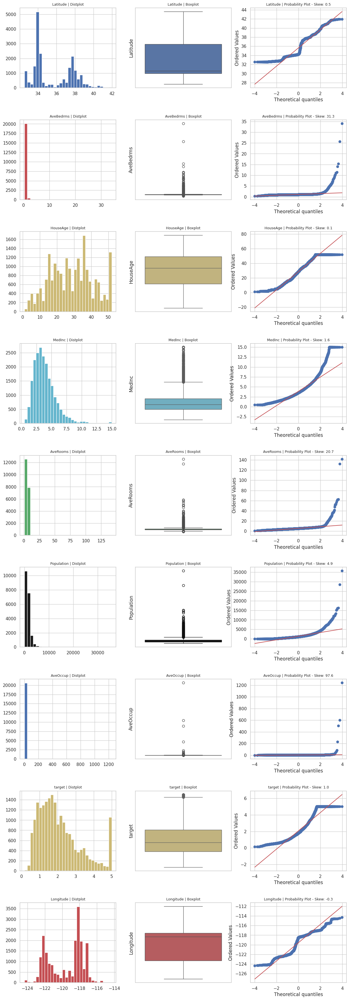

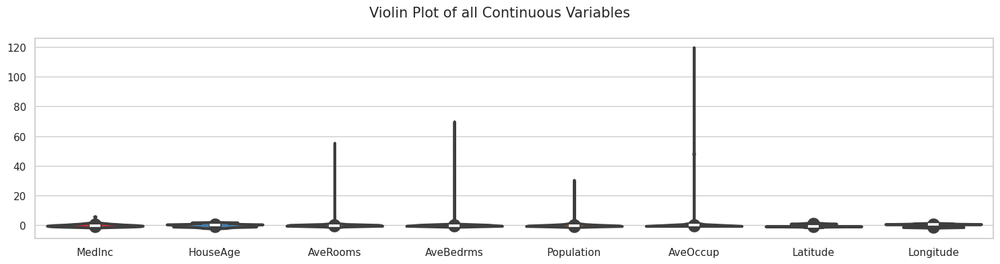

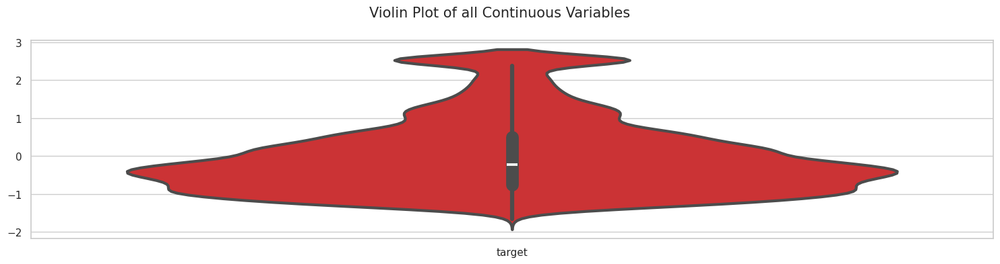

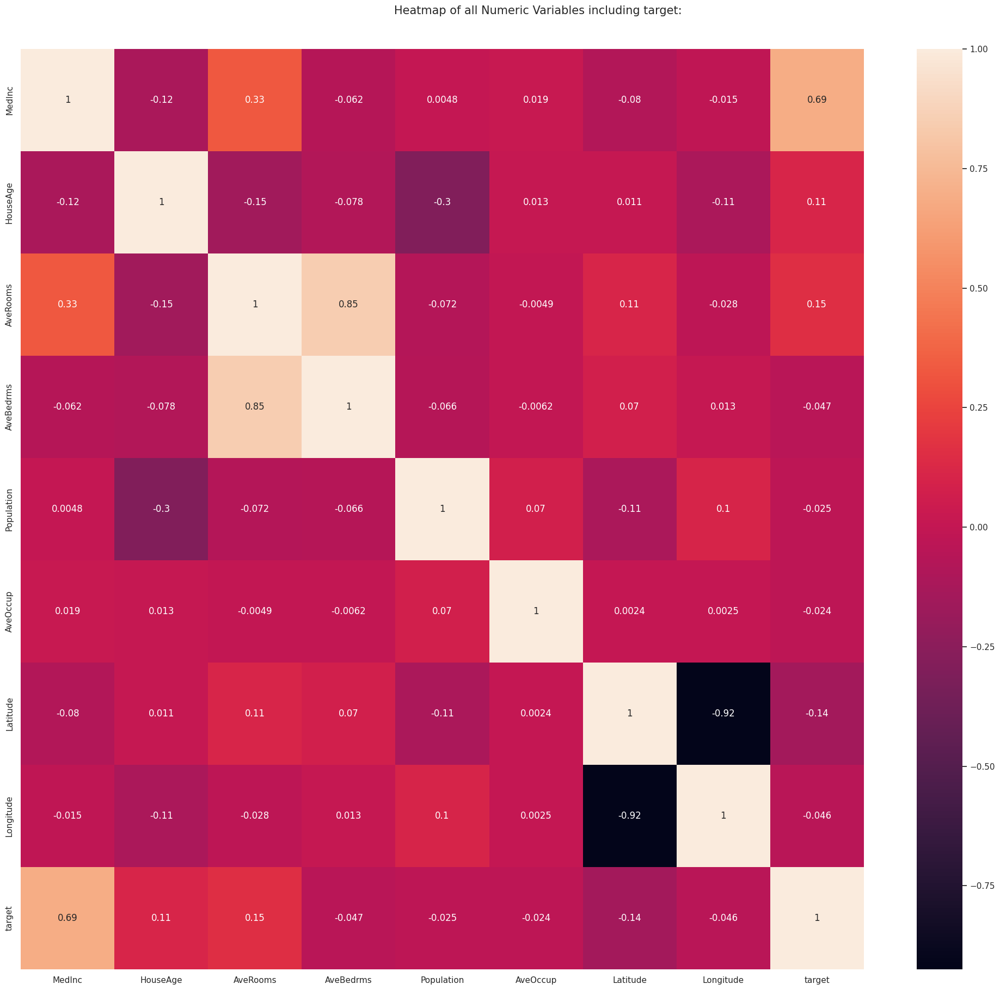

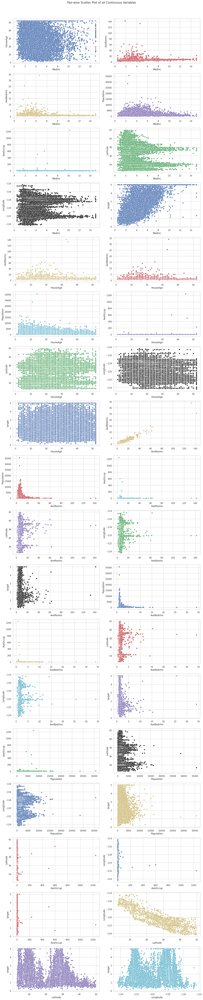

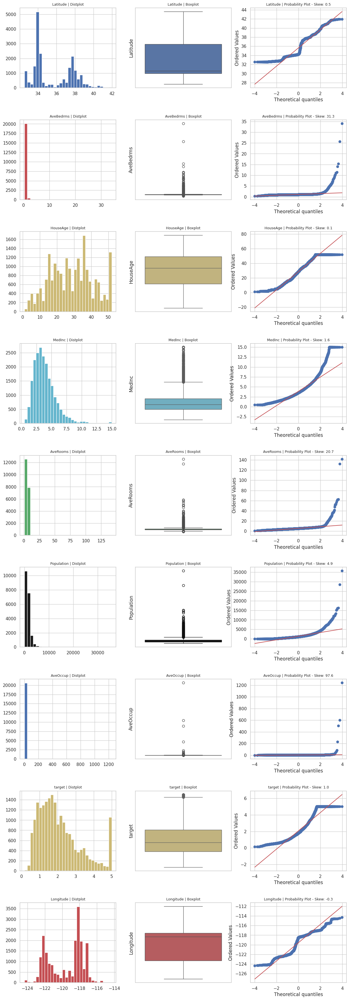

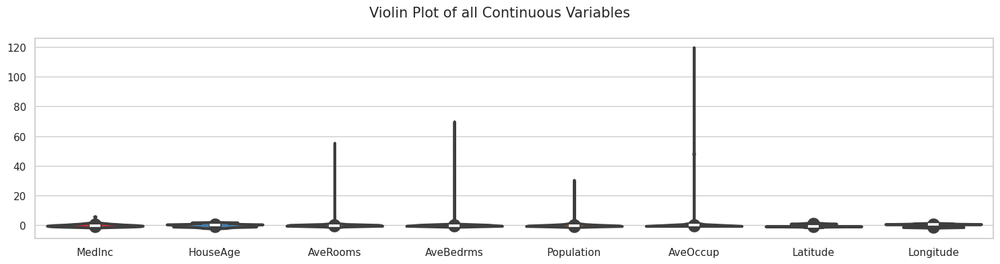

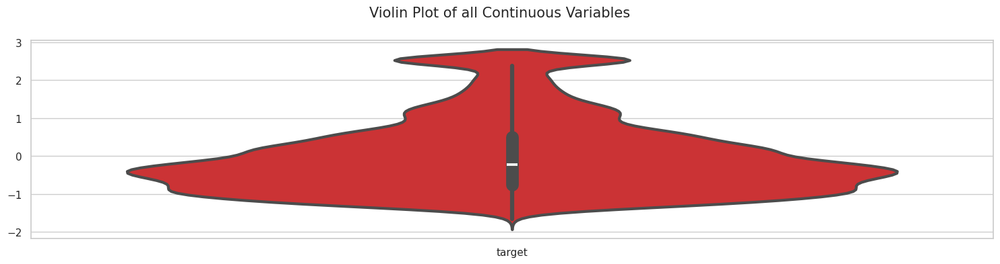

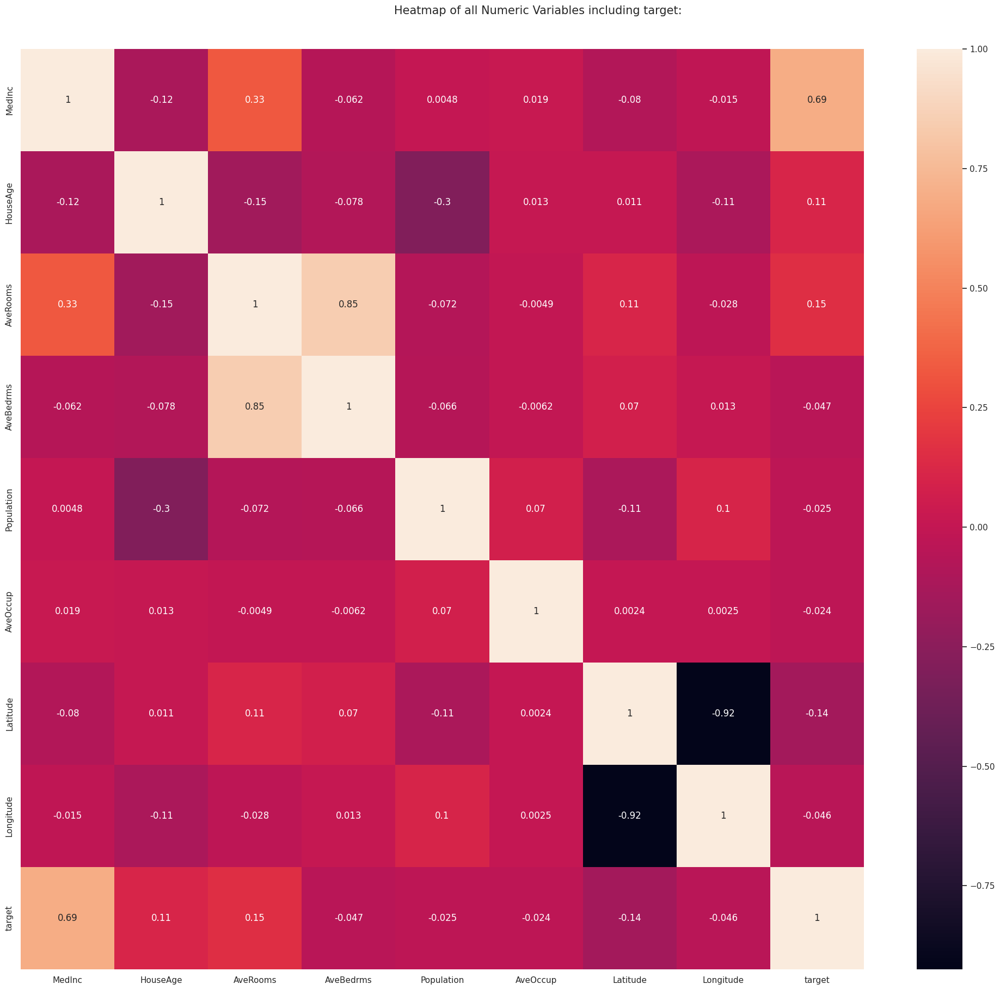

All Plots done
Time to run AutoViz = 40 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# Se habilita el dibujado de gráficos con matplotlib
%matplotlib inline

# Se ejecuta getAutomaticStatisticalEDA para instalar la librería Autiviz y obtener un análisis gráfico automático
eda.getAutomaticGraphicalEDA()

# 5. Entrenamiento y Validación del Modelo

En este apartado se tomarán todas las decisiones necesarias para el entrenamiento y la evaluación del modelo de predicción de la variable target del presente conjunto de datos.

En primer lugar se divide el dataset extrayendo la variable target del resto del dataframe, el cual se considerará como el conjunto de predictores.

El siguiente paso es seleccionar la técnica de cross-validation, para este fin se utilizará KFold y concretamente establecer la división en 5 subconjuntos.

Respecto al pipeline, la decisión tomada fue emplear StandardScaler para la estandarización de las variables numéricas.

La métrica encargada de la evaluación del modelo será el coeficiente de determinación o R², la cual compara la variabilidad en la predicción del modelo respecto a la variabilidad total de la variable independiente. Su rango de valores se encuentra entre [0, 1] y cuanto más cercano a 1 sea mejor rendimiento demuestra el modelo.

En cuanto a la elección del algoritmo para entrenar el modelo, se aplicarán los siguientes algoritmos de regresión para estudiar cual ofrece un mejor rendimiento:

* LinearRegression: técnica que asume una relación lineal entre las variables predictoras y la variable objetivo. El objetivo es encontrar la línea  que minimiza la suma de los cuadrados de las diferencias entre las predicciones del modelo y los valores reales de la variable dependiente.

* Support Vector Regression: utiliza máquinas de vectores de soporte para la regresión. Puede manejar relaciones no lineales mediante el uso de diferentes funciones de kernel.

* Decision Tree Regressor: utiliza árboles de decisión para modelar relaciones no lineales en los datos.

Finalmente, todas estas decisiones serán los argumentos de la función evaluate, que mostrará como resultado la métrica de evaluación obtenida para cada subconjunto de cross-validation y el promedio de estas.

In [ ]:
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from typing import Iterable
from sklearn.model_selection import cross_val_score

# Se separa el dataframe en la variable objetivo y el conjunto de predictores
y = data['target']
x = data.drop('target', axis=1)

# Se inicializa KFold para obtener 5 subconjuntos
kf = KFold(n_splits=5)

# Se crea el array de pipelines, cada uno contendrá StandardScaler para la estandarización y un algoritmo de regresión distinto
pipelines = [
    Pipeline([
      ('scaler', StandardScaler()),
      ('lr', LinearRegression())
    ]),
    Pipeline([
      ('scaler', StandardScaler()),
      ('svr', SVR())
    ]),
    Pipeline([
      ('scaler', StandardScaler()),
      ('dtr', DecisionTreeRegressor())
    ])
]

# Se declara la función para realizar el entrenamiento y evaluación de modelos
def evaluate(pipeline: Pipeline, x: pd.DataFrame, y: pd.Series, scoring: str = 'r2', cv: int or KFold or Iterable = 5) -> None:
    """
    Evalúa un modelo utilizando validación cruzada y muestra los resultados.

    Parámetros:
    - pipeline (Pipeline): El modelo o pipeline a evaluar.
    - x (pd.DataFrame): Las características del conjunto de datos.
    - y (pd.Series): Las etiquetas del conjunto de datos.
    - scoring (str): La métrica de evaluación. Por defecto, 'r2'.
    - cv (int or KFold or iterable): Estrategia de validación cruzada. Por defecto, 5 divisiones.
    """
    cv_scores = cross_val_score(pipeline, x, y, scoring=scoring, cv=cv)
    print("CV Scores", cv_scores)
    print("Average CV Score", cv_scores.mean())

# Se evalua cada pipeline con la métrica r2 y utilizando la técnica de cross-validation seleccionada
print("1. Linear Regression: ")
evaluate(pipelines[0], x, y, scoring='r2', cv=kf)

print("\n2. Support Vector Regression: ")
evaluate(pipelines[1], x, y, scoring='r2', cv=kf)

print("\n3. Decision Tree Regressor: ")
evaluate(pipelines[2], x, y, scoring='r2', cv=kf)

1. Linear Regression: 
CV Scores [0.54866323 0.46820691 0.55078434 0.53698703 0.66051406]
Average CV Score 0.5530311140279566

2. Support Vector Regression: 
CV Scores [0.74259473 0.6017722  0.68438388 0.60508711 0.70964174]
Average CV Score 0.6686959330424095

3. Decision Tree Regressor: 
CV Scores [0.27639044 0.33981363 0.45226583 0.22029373 0.40757765]
Average CV Score 0.33926825399921146


El algoritmo que mejores resultados ha obtenido ha sido Support Vector Regression, este hecho puede deberse a su capacidad de modelar relaciones no lineales mediante el uso de diferentes funciones de kernel y su idoneidad para adaptarse a patrones más complejos en los datos.

